# **RempahPedia Modelling Notebook [ResNet101_Overfit] [FAIL]**
- **ML Members     :**
##### - Muhammad Ruzain
##### - Fedro Maulana Jatmika
##### - Marsel Christian Junior
- **Email          :** rempahpedia@bangkit.academy

- **GitHub :** <a href='https://github.com/RempahPedia' target="_blank">RempahPedia</a>

- **Dataset Source :** <a href='https://drive.google.com/file/d/1GJKr1EghItXtX5Qu58CpTTZUwPZKBFv2/view?usp=sharing' target="_blank">Dataset_RempahPedia.zip</a>

### **Install Library** <small>*#If_Necessary*</small>

In [1]:
!pip install tensorflow
!pip install opencv-python
!pip install torch torchvision
!pip install tensorflow-addons
!pip install keras
!pip install gdown

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (99 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21

In [2]:
!pip install split_folders tqdm

In [3]:
!pip install split-folders

In [4]:
!pip install --upgrade tensorflow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 589.8/589.8 MB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.3/5.3 MB 40.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 44.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 23.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 31.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 311.2/311.2 kB 37.0 MB/s eta 0:00:00
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.2.0
    Uninstalling ml-dtypes-0.2.0:
      Successfully uninstalled ml-dtypes-0.2.0
  Attempting uninstall: h5py
    Found existing installation: h5py 3.9.0
    Uninstalling h5py-3.9.0:
      Successfully uninstalled h5py-3.9.0
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.15.2
    Uninstalling tensorboard-2.15.2:
      Successfully uninstalled tensorboard-2.15.2
  Attempting uninstall: keras
    Fo

### **Import Library**

In [5]:
import tensorflow as tf
print(tf.__version__)

device_name = tf.test.gpu_device_name()
if len(device_name) > 0:
    print("Found GPU at: {}".format(device_name))
else:
    device_name = "/device:CPU:0"
    print("No GPU, using {}.".format(device_name))

2.16.1
Found GPU at: /device:GPU:0


In [6]:
import numpy as np
import gdown
import os
import shutil
import seaborn as sns
import zipfile
import cv2
import splitfolders
import matplotlib.pyplot as plt
from PIL import Image

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, f1_score, precision_score, recall_score

from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import Callback, ReduceLROnPlateau
from tensorflow.keras.layers import Input, Dense, Conv2D, MaxPooling2D, Flatten, Dropout,GlobalAveragePooling2D
from tensorflow.keras.models import Model, Sequential, load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam

from tensorflow.keras.applications import ResNet101
# from tensorflow.keras.applications import MobileNetV3Small,MobileNetV3Large
# from tensorflow.keras.applications import DenseNet121
# from tensorflow.keras.applications.vgg16 import VGG16
# from tensorflow.keras.applications.vgg16 import preprocess_input

### **Import Dataset**

In [7]:
file_id = "1GJKr1EghItXtX5Qu58CpTTZUwPZKBFv2"

url = 'https://drive.google.com/uc?id=' + file_id
output = 'Spices_RempahPedia.zip'

gdown.download(url, output, quiet=False)

with zipfile.ZipFile(output, 'r') as zip_ref:
    zip_ref.extractall('datasets/')

Downloading...
From (original): https://drive.google.com/uc?id=1GJKr1EghItXtX5Qu58CpTTZUwPZKBFv2
From (redirected): https://drive.google.com/uc?id=1GJKr1EghItXtX5Qu58CpTTZUwPZKBFv2&confirm=t&uuid=b20a6f56-1f5c-4c87-90da-ef3d5c1b58d4
To: /content/Spices_RempahPedia.zip
100%|██████████| 689M/689M [00:12<00:00, 55.3MB/s]


In [8]:
!sudo apt install tree

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following NEW packages will be installed:
  tree
0 upgraded, 1 newly installed, 0 to remove and 45 not upgraded.
Need to get 47.9 kB of archives.
After this operation, 116 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tree amd64 2.0.2-1 [47.9 kB]
Fetched 47.9 kB in 0s (609 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 78, <> line 1.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg-preconfigure: unable to re-open stdin: 
Selecting previously unselected package tree.
(Reading database ... 121913 files and directories currently install

In [9]:
!tree -d /content/datasets

/content/datasets
├── adas
├── andaliman
├── asam jawa
├── bawang bombai
├── bawang merah
├── bawang putih
├── biji ketumbar
├── bukan rempah
├── bunga lawang
├── cengkeh
├── daun jeruk
├── daun kemangi
├── daun ketumbar
├── daun salam
├── jahe
├── jinten
├── kapulaga
├── kayu manis
├── kayu secang
├── kemiri
├── kemukus
├── kencur
├── kluwek
├── kunyit
├── lada
├── lengkuas
├── pala
├── saffron
├── serai
├── vanili
└── wijen

31 directories


### **Data Cleaning**

In [10]:
def check_and_remove_invalid_images(root_dir):
    invalid_files = []
    for subdir, dirs, files in os.walk(root_dir):
        for file in files:
            file_path = os.path.join(subdir, file)
            try:
                with Image.open(file_path) as img:
                    img.verify()  # Attempt to open and verify the image
            except Exception as e:
                print(f"Error processing image: {file_path} - {e}")
                invalid_files.append(file_path)
    # Remove invalid files
    for invalid_file in invalid_files:
        os.remove(invalid_file)
        print(f"Invalid image removed: {invalid_file}")

In [11]:
def get_file_paths_and_labels(root_dir):
    # Check and remove invalid images before collecting file paths and labels
    check_and_remove_invalid_images(root_dir)

    file_paths = []
    labels = []
    for subdir, dirs, files in os.walk(root_dir):
        for file in files:
            file_path = os.path.join(subdir, file)
            label = os.path.basename(subdir)
            file_paths.append(file_path)
            labels.append(label)
    return file_paths, labels

In [12]:
# Direktori asal, train, dan validation
colab_prefix_dir = '/content/'
prefix_dir = colab_prefix_dir

root_dir = prefix_dir + 'datasets/'
train_dir = prefix_dir + 'final-datasets/train'
val_dir = prefix_dir + 'final-datasets/valid'

# Membuat direktori train dan validation jika belum ada
os.makedirs(train_dir, exist_ok=True)
os.makedirs(val_dir, exist_ok=True)

# Mendapatkan semua jalur file dan labelnya
file_paths, labels = get_file_paths_and_labels(root_dir)

Error processing image: /content/datasets/bawang putih/bawang_putih_203.jpg - cannot identify image file '/content/datasets/bawang putih/bawang_putih_203.jpg'
Error processing image: /content/datasets/daun kemangi/daun_kemangi_189.jpg - cannot identify image file '/content/datasets/daun kemangi/daun_kemangi_189.jpg'
Error processing image: /content/datasets/daun kemangi/daun_kemangi_221.jpg - cannot identify image file '/content/datasets/daun kemangi/daun_kemangi_221.jpg'
Error processing image: /content/datasets/daun kemangi/daun_kemangi_196.jpg - cannot identify image file '/content/datasets/daun kemangi/daun_kemangi_196.jpg'
Invalid image removed: /content/datasets/bawang putih/bawang_putih_203.jpg
Invalid image removed: /content/datasets/daun kemangi/daun_kemangi_189.jpg
Invalid image removed: /content/datasets/daun kemangi/daun_kemangi_221.jpg
Invalid image removed: /content/datasets/daun kemangi/daun_kemangi_196.jpg


### **Split Dataset**

In [13]:
def split_and_move_files(file_paths, labels, train_dir, val_dir, test_size=0.2):
    X_train, X_val, y_train, y_val = train_test_split(file_paths, labels, test_size=test_size, stratify=labels, random_state=234)

    for file_path, label in zip(X_train, y_train):
        label_dir = os.path.join(train_dir, label)
        os.makedirs(label_dir, exist_ok=True)
        shutil.copy(file_path, label_dir)

    for file_path, label in zip(X_val, y_val):
        label_dir = os.path.join(val_dir, label)
        os.makedirs(label_dir, exist_ok=True)
        shutil.copy(file_path, label_dir)

In [14]:
split_and_move_files(
    file_paths,
    labels,
    train_dir,
    val_dir,
    test_size=0.2
    )

### **Data Augmentation**

In [15]:
# ImageDataGenerator for training & validation
train_datagen = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
    )
val_datagen = ImageDataGenerator(rescale=1./255,
                                 validation_split = 0.4
                                 )

# generator for training & validation
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
    )

validation_generator = val_datagen.flow_from_directory(
    val_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
    )

Found 5645 images belonging to 31 classes.
Found 1412 images belonging to 31 classes.


### **Train & Validation**





In [18]:
import matplotlib.pyplot as plt

def plot_history(history):
    # Collecting data from history
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    accuracy = history.history['accuracy']
    val_accuracy = history.history['val_accuracy']
    epochs = range(1, len(loss) + 1)

    # Plotting loss
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    # Plotting Training & Validation Loss
    axes[0].plot(epochs, loss, 'b', label='Training loss')
    axes[0].plot(epochs, val_loss, 'r', label='Validation loss')
    axes[0].set_title('Training and Validation Loss')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Loss')
    axes[0].legend()

    # Plotting Training & Validation Accuracy
    axes[1].plot(epochs, accuracy, 'b', label='Training Accuracy')
    axes[1].plot(epochs, val_accuracy, 'r', label='Validation Accuracy')
    axes[1].set_title('Training and Validation Accuracy')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('Accuracy')
    axes[1].legend()

    # Show plot
    plt.tight_layout()
    plt.show()

In [19]:
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=5,
    verbose=1,
    restore_best_weights=True
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=3,
    min_lr=3e-7
)

In [20]:
!tree -d /content/final-datasets

/content/final-datasets
├── train
│   ├── adas
│   ├── andaliman
│   ├── asam jawa
│   ├── bawang bombai
│   ├── bawang merah
│   ├── bawang putih
│   ├── biji ketumbar
│   ├── bukan rempah
│   ├── bunga lawang
│   ├── cengkeh
│   ├── daun jeruk
│   ├── daun kemangi
│   ├── daun ketumbar
│   ├── daun salam
│   ├── jahe
│   ├── jinten
│   ├── kapulaga
│   ├── kayu manis
│   ├── kayu secang
│   ├── kemiri
│   ├── kemukus
│   ├── kencur
│   ├── kluwek
│   ├── kunyit
│   ├── lada
│   ├── lengkuas
│   ├── pala
│   ├── saffron
│   ├── serai
│   ├── vanili
│   └── wijen
└── valid
    ├── adas
    ├── andaliman
    ├── asam jawa
    ├── bawang bombai
    ├── bawang merah
    ├── bawang putih
    ├── biji ketumbar
    ├── bukan rempah
    ├── bunga lawang
    ├── cengkeh
    ├── daun jeruk
    ├── daun kemangi
    ├── daun ketumbar
    ├── daun salam
    ├── jahe
    ├── jinten
    ├── kapulaga
    ├── kayu manis
    ├── kayu secang
    ├── kemiri
    ├── kemukus
    ├── kencur
    ├── kluwek
 

In [21]:
#1st BLOK

# BLOK ADAS
adas_dir = os.path.join('/content/datasets/adas')
train_adas_dir = os.path.join('/content/final-datasets/train/adas')
val_adas_dir = os.path.join('/content/final-datasets/valid/adas')

# BLOK ANDALIMAN
andaliman_dir = os.path.join('/content/datasets/andaliman')
train_andaliman_dir = os.path.join('/content/final-datasets/train/andaliman')
val_andaliman_dir = os.path.join('/content/final-datasets/valid/andaliman')

# BLOK ASAM JAWA
asamjawa_dir = os.path.join('/content/datasets/asam jawa')
train_asamjawa_dir = os.path.join('/content/final-datasets/train/asam jawa')
val_asamjawa_dir = os.path.join('/content/final-datasets/valid/asam jawa')


print('\nJumlah Gambar Adas:', len(os.listdir(adas_dir)))
print('Pelatihan:', len(os.listdir(train_adas_dir)))
print('Validasi:', len(os.listdir(val_adas_dir)))

print('\n')

print('Jumlah Gambar Andaliman:', len(os.listdir(andaliman_dir)))
print('Pelatihan:', len(os.listdir(train_andaliman_dir)))
print('Validasi:', len(os.listdir(val_andaliman_dir)))

print('\n')
print('Jumlah Gambar Asam Jawa:', len(os.listdir(asamjawa_dir)))
print('Pelatihan:', len(os.listdir(train_asamjawa_dir)))
print('Validasi:', len(os.listdir(val_asamjawa_dir)))


Jumlah Gambar Adas: 221
Pelatihan: 177
Validasi: 44


Jumlah Gambar Andaliman: 195
Pelatihan: 156
Validasi: 39


Jumlah Gambar Asam Jawa: 201
Pelatihan: 161
Validasi: 40


In [22]:
#2nd BLOK

# BLOK BAWANG BOMBAI
bombai_dir = os.path.join('/content/datasets/bawang bombai')
train_bombai_dir = os.path.join('/content/final-datasets/train/bawang bombai')
val_bombai_dir = os.path.join('/content/final-datasets/valid/bawang bombai')

# BLOK BAWANG MERAH
bmerah_dir = os.path.join('/content/datasets/bawang merah')
train_bmerah_dir = os.path.join('/content/final-datasets/train/bawang merah')
val_bmerah_dir = os.path.join('/content/final-datasets/valid/bawang merah')

# BLOK BAWANG PUTIH
bputih_dir = os.path.join('/content/datasets/bawang putih')
train_bputih_dir = os.path.join('/content/final-datasets/train/bawang putih')
val_bputih_dir = os.path.join('/content/final-datasets/valid/bawang putih')


print('\nJumlah Gambar Bawang Bombai:', len(os.listdir(bombai_dir)))
print('Pelatihan:', len(os.listdir(train_bombai_dir)))
print('Validasi:', len(os.listdir(val_bombai_dir)))

print('\n')

print('Jumlah Gambar Bawang Merah:', len(os.listdir(bmerah_dir)))
print('Pelatihan:', len(os.listdir(train_bmerah_dir)))
print('Validasi:', len(os.listdir(val_bmerah_dir)))

print('\n')
print('Jumlah Gambar Bawang Putih:', len(os.listdir(bputih_dir)))
print('Pelatihan:', len(os.listdir(train_bputih_dir)))
print('Validasi:', len(os.listdir(val_bputih_dir)))


Jumlah Gambar Bawang Bombai: 237
Pelatihan: 190
Validasi: 47


Jumlah Gambar Bawang Merah: 246
Pelatihan: 197
Validasi: 49


Jumlah Gambar Bawang Putih: 247
Pelatihan: 198
Validasi: 49


In [23]:
#3rd BLOK

# BLOK BIJI KETUMBAR
bketumbar_dir = os.path.join('/content/datasets/biji ketumbar')
train_bketumbar_dir = os.path.join('/content/final-datasets/train/biji ketumbar')
val_bketumbar_dir = os.path.join('/content/final-datasets/valid/biji ketumbar')

# BLOK BUKAN REMPAH
brempah_dir = os.path.join('/content/datasets/bukan rempah')
train_brempah_dir = os.path.join('/content/final-datasets/train/bukan rempah')
val_brempah_dir = os.path.join('/content/final-datasets/valid/bukan rempah')

# BLOK BUNGA LAWANG
blawang_dir = os.path.join('/content/datasets/bunga lawang')
train_blawang_dir = os.path.join('/content/final-datasets/train/bunga lawang')
val_blawang_dir = os.path.join('/content/final-datasets/valid/bunga lawang')


print('\nJumlah Gambar Biji Ketumbar:', len(os.listdir(bketumbar_dir)))
print('Pelatihan:', len(os.listdir(train_bketumbar_dir)))
print('Validasi:', len(os.listdir(val_bketumbar_dir)))

print('\n')

print('Jumlah Gambar Bukan Rempah:', len(os.listdir(brempah_dir)))
print('Pelatihan:', len(os.listdir(train_brempah_dir)))
print('Validasi:', len(os.listdir(val_brempah_dir)))

print('\n')
print('Jumlah Gambar Bunga Lawang:', len(os.listdir(blawang_dir)))
print('Pelatihan:', len(os.listdir(train_blawang_dir)))
print('Validasi:', len(os.listdir(val_blawang_dir)))


Jumlah Gambar Biji Ketumbar: 223
Pelatihan: 178
Validasi: 45


Jumlah Gambar Bukan Rempah: 203
Pelatihan: 162
Validasi: 41


Jumlah Gambar Bunga Lawang: 254
Pelatihan: 203
Validasi: 51


In [24]:
#4th BLOK

# BLOK CENGKEH
cengkeh_dir = os.path.join('/content/datasets/cengkeh')
train_cengkeh_dir = os.path.join('/content/final-datasets/train/cengkeh')
val_cengkeh_dir = os.path.join('/content/final-datasets/valid/cengkeh')

# BLOK DAUN JERUK
djeruk_dir = os.path.join('/content/datasets/daun jeruk')
train_djeruk_dir = os.path.join('/content/final-datasets/train/daun jeruk')
val_djeruk_dir = os.path.join('/content/final-datasets/valid/daun jeruk')

# BLOK DAUN KEMANGI
kemangi_dir = os.path.join('/content/datasets/daun kemangi')
train_kemangi_dir = os.path.join('/content/final-datasets/train/daun kemangi')
val_kemangi_dir = os.path.join('/content/final-datasets/valid/daun kemangi')


print('\nJumlah Gambar Cengkeh:', len(os.listdir(cengkeh_dir)))
print('Pelatihan:', len(os.listdir(train_cengkeh_dir)))
print('Validasi:', len(os.listdir(val_cengkeh_dir)))

print('\n')

print('Jumlah Gambar Daun Jeruk:', len(os.listdir(djeruk_dir)))
print('Pelatihan:', len(os.listdir(train_djeruk_dir)))
print('Validasi:', len(os.listdir(val_djeruk_dir)))

print('\n')
print('Jumlah Gambar Daun Kemangi:', len(os.listdir(kemangi_dir)))
print('Pelatihan:', len(os.listdir(train_kemangi_dir)))
print('Validasi:', len(os.listdir(val_kemangi_dir)))


Jumlah Gambar Cengkeh: 202
Pelatihan: 162
Validasi: 40


Jumlah Gambar Daun Jeruk: 230
Pelatihan: 184
Validasi: 46


Jumlah Gambar Daun Kemangi: 228
Pelatihan: 182
Validasi: 46


In [25]:
#5th BLOK

# BLOK DAUN KETUMBAR
dketumbar_dir = os.path.join('/content/datasets/daun ketumbar')
train_dketumbar_dir = os.path.join('/content/final-datasets/train/daun ketumbar')
val_dketumbar_dir = os.path.join('/content/final-datasets/valid/daun ketumbar')

# BLOK DAUN SALAM
dsalam_dir = os.path.join('/content/datasets/daun salam')
train_dsalam_dir = os.path.join('/content/final-datasets/train/daun salam')
val_dsalam_dir = os.path.join('/content/final-datasets/valid/daun salam')

# BLOK JAHE
jahe_dir = os.path.join('/content/datasets/jahe')
train_jahe_dir = os.path.join('/content/final-datasets/train/jahe')
val_jahe_dir = os.path.join('/content/final-datasets/valid/jahe')


print('\nJumlah Gambar Daun Ketumbar:', len(os.listdir(dketumbar_dir)))
print('Pelatihan:', len(os.listdir(train_dketumbar_dir)))
print('Validasi:', len(os.listdir(val_dketumbar_dir)))

print('\n')

print('Jumlah Gambar Daun Salam:', len(os.listdir(dsalam_dir)))
print('Pelatihan:', len(os.listdir(train_dsalam_dir)))
print('Validasi:', len(os.listdir(val_dsalam_dir)))

print('\n')
print('Jumlah Gambar Jahe:', len(os.listdir(jahe_dir)))
print('Pelatihan:', len(os.listdir(train_jahe_dir)))
print('Validasi:', len(os.listdir(val_jahe_dir)))


Jumlah Gambar Daun Ketumbar: 215
Pelatihan: 172
Validasi: 43


Jumlah Gambar Daun Salam: 233
Pelatihan: 186
Validasi: 47


Jumlah Gambar Jahe: 264
Pelatihan: 211
Validasi: 53


In [26]:
#6th BLOK

# BLOK DAUN JINTEN
jinten_dir = os.path.join('/content/datasets/jinten')
train_jinten_dir = os.path.join('/content/final-datasets/train/jinten')
val_jinten_dir = os.path.join('/content/final-datasets/valid/jinten')

# BLOK DAUN KAPULAGA
kapulaga_dir = os.path.join('/content/datasets/kapulaga')
train_kapulaga_dir = os.path.join('/content/final-datasets/train/kapulaga')
val_kapulaga_dir = os.path.join('/content/final-datasets/valid/kapulaga')

# BLOK KAYU MANIS
kmanis_dir = os.path.join('/content/datasets/kayu manis')
train_kmanis_dir = os.path.join('/content/final-datasets/train/kayu manis')
val_kmanis_dir = os.path.join('/content/final-datasets/valid/kayu manis')


print('\nJumlah Gambar Jinten:', len(os.listdir(jinten_dir)))
print('Pelatihan:', len(os.listdir(train_jinten_dir)))
print('Validasi:', len(os.listdir(val_jinten_dir)))

print('\n')

print('Jumlah Gambar Kapulaga:', len(os.listdir(kapulaga_dir)))
print('Pelatihan:', len(os.listdir(train_kapulaga_dir)))
print('Validasi:', len(os.listdir(val_kapulaga_dir)))

print('\n')
print('Jumlah Gambar Kayu Manis:', len(os.listdir(kmanis_dir)))
print('Pelatihan:', len(os.listdir(train_kmanis_dir)))
print('Validasi:', len(os.listdir(val_kmanis_dir)))


Jumlah Gambar Jinten: 210
Pelatihan: 168
Validasi: 42


Jumlah Gambar Kapulaga: 260
Pelatihan: 208
Validasi: 52


Jumlah Gambar Kayu Manis: 314
Pelatihan: 251
Validasi: 63


In [27]:
#7th BLOK

# BLOK KAYU SECANG
secang_dir = os.path.join('/content/datasets/kayu secang')
train_secang_dir = os.path.join('/content/final-datasets/train/kayu secang')
val_secang_dir = os.path.join('/content/final-datasets/valid/kayu secang')

# BLOK KEMIRI
kemiri_dir = os.path.join('/content/datasets/kemiri')
train_kemiri_dir = os.path.join('/content/final-datasets/train/kemiri')
val_kemiri_dir = os.path.join('/content/final-datasets/valid/kemiri')

# BLOK KEMUKUS
kemukus_dir = os.path.join('/content/datasets/kemukus')
train_kemukus_dir = os.path.join('/content/final-datasets/train/kemukus')
val_kemukus_dir = os.path.join('/content/final-datasets/valid/kemukus')


print('\nJumlah Gambar Kayu Secang:', len(os.listdir(secang_dir)))
print('Pelatihan:', len(os.listdir(train_secang_dir)))
print('Validasi:', len(os.listdir(val_secang_dir)))

print('\n')

print('Jumlah Gambar Kemiri:', len(os.listdir(kemiri_dir)))
print('Pelatihan:', len(os.listdir(train_kemiri_dir)))
print('Validasi:', len(os.listdir(val_kemiri_dir)))

print('\n')
print('Jumlah Gambar Kemukus:', len(os.listdir(kemukus_dir)))
print('Pelatihan:', len(os.listdir(train_kemukus_dir)))
print('Validasi:', len(os.listdir(val_kemukus_dir)))


Jumlah Gambar Kayu Secang: 210
Pelatihan: 168
Validasi: 42


Jumlah Gambar Kemiri: 243
Pelatihan: 194
Validasi: 49


Jumlah Gambar Kemukus: 200
Pelatihan: 160
Validasi: 40


In [28]:
#8th BLOK

# BLOK KENCUR
kencur_dir = os.path.join('/content/datasets/kencur')
train_kencur_dir = os.path.join('/content/final-datasets/train/kencur')
val_kencur_dir = os.path.join('/content/final-datasets/valid/kencur')

# BLOK KLUWEK
kluwek_dir = os.path.join('/content/datasets/kluwek')
train_kluwek_dir = os.path.join('/content/final-datasets/train/kluwek')
val_kluwek_dir = os.path.join('/content/final-datasets/valid/kluwek')

# BLOK KUNYIT
kunyit_dir = os.path.join('/content/datasets/kunyit')
train_kunyit_dir = os.path.join('/content/final-datasets/train/kunyit')
val_kunyit_dir = os.path.join('/content/final-datasets/valid/kunyit')


print('\nJumlah Gambar Kencur:', len(os.listdir(kencur_dir)))
print('Pelatihan:', len(os.listdir(train_kencur_dir)))
print('Validasi:', len(os.listdir(val_kencur_dir)))

print('\n')

print('Jumlah Gambar Kluwek:', len(os.listdir(kluwek_dir)))
print('Pelatihan:', len(os.listdir(train_kluwek_dir)))
print('Validasi:', len(os.listdir(val_kluwek_dir)))

print('\n')
print('Jumlah Gambar Kunyit:', len(os.listdir(kunyit_dir)))
print('Pelatihan:', len(os.listdir(train_kunyit_dir)))
print('Validasi:', len(os.listdir(val_kunyit_dir)))


Jumlah Gambar Kencur: 199
Pelatihan: 159
Validasi: 40


Jumlah Gambar Kluwek: 220
Pelatihan: 176
Validasi: 44


Jumlah Gambar Kunyit: 283
Pelatihan: 226
Validasi: 57


In [29]:
#9th BLOK

# BLOK LADA
lada_dir = os.path.join('/content/datasets/lada')
train_lada_dir = os.path.join('/content/final-datasets/train/lada')
val_lada_dir = os.path.join('/content/final-datasets/valid/lada')

# BLOK LENGKUAS
lengkuas_dir = os.path.join('/content/datasets/lengkuas')
train_lengkuas_dir = os.path.join('/content/final-datasets/train/lengkuas')
val_lengkuas_dir = os.path.join('/content/final-datasets/valid/lengkuas')

# BLOK PALA
pala_dir = os.path.join('/content/datasets/pala')
train_pala_dir = os.path.join('/content/final-datasets/train/pala')
val_pala_dir = os.path.join('/content/final-datasets/valid/pala')


print('\nJumlah Gambar Lada:', len(os.listdir(lada_dir)))
print('Pelatihan:', len(os.listdir(train_lada_dir)))
print('Validasi:', len(os.listdir(val_lada_dir)))

print('\n')

print('Jumlah Gambar Lengkuas:', len(os.listdir(lengkuas_dir)))
print('Pelatihan:', len(os.listdir(train_lengkuas_dir)))
print('Validasi:', len(os.listdir(val_lengkuas_dir)))

print('\n')
print('Jumlah Gambar Biji Pala:', len(os.listdir(pala_dir)))
print('Pelatihan:', len(os.listdir(train_pala_dir)))
print('Validasi:', len(os.listdir(val_pala_dir)))


Jumlah Gambar Lada: 211
Pelatihan: 169
Validasi: 42


Jumlah Gambar Lengkuas: 247
Pelatihan: 198
Validasi: 49


Jumlah Gambar Biji Pala: 232
Pelatihan: 186
Validasi: 46


In [30]:
#10th BLOK

# BLOK SAFFRON
saffron_dir = os.path.join('/content/datasets/saffron')
train_saffron_dir = os.path.join('/content/final-datasets/train/saffron')
val_saffron_dir = os.path.join('/content/final-datasets/valid/saffron')

# BLOK SERAI
serai_dir = os.path.join('/content/datasets/serai')
train_serai_dir = os.path.join('/content/final-datasets/train/serai')
val_serai_dir = os.path.join('/content/final-datasets/valid/serai')

# BLOK VANILI
vanili_dir = os.path.join('/content/datasets/vanili')
train_vanili_dir = os.path.join('/content/final-datasets/train/vanili')
val_vanili_dir = os.path.join('/content/final-datasets/valid/vanili')

# BLOK WIJEN
wijen_dir = os.path.join('/content/datasets/wijen')
train_wijen_dir = os.path.join('/content/final-datasets/train/wijen')
val_wijen_dir = os.path.join('/content/final-datasets/valid/wijen')


print('\nJumlah Gambar Saffron:', len(os.listdir(saffron_dir)))
print('Pelatihan:', len(os.listdir(train_saffron_dir)))
print('Validasi:', len(os.listdir(val_saffron_dir)))

print('\n')

print('Jumlah Gambar Serai:', len(os.listdir(serai_dir)))
print('Pelatihan:', len(os.listdir(train_serai_dir)))
print('Validasi:', len(os.listdir(val_serai_dir)))

print('\n')
print('Jumlah Gambar Vanili:', len(os.listdir(vanili_dir)))
print('Pelatihan:', len(os.listdir(train_vanili_dir)))
print('Validasi:', len(os.listdir(val_vanili_dir)))

print('\n')

print('Jumlah Gambar Biji Wijen:', len(os.listdir(wijen_dir)))
print('Pelatihan:', len(os.listdir(train_wijen_dir)))
print('Validasi:', len(os.listdir(val_wijen_dir)))


Jumlah Gambar Saffron: 202
Pelatihan: 162
Validasi: 40


Jumlah Gambar Serai: 203
Pelatihan: 162
Validasi: 41


Jumlah Gambar Vanili: 200
Pelatihan: 160
Validasi: 40


Jumlah Gambar Biji Wijen: 224
Pelatihan: 179
Validasi: 45


In [31]:
print('Total Gambar:', len(os.listdir(adas_dir))+len(os.listdir(andaliman_dir))+ len(os.listdir(asamjawa_dir)) + len(os.listdir(bombai_dir))+len(os.listdir(bmerah_dir))+ len(os.listdir(bputih_dir)) + len(os.listdir(bketumbar_dir))+len(os.listdir(brempah_dir))+ len(os.listdir(blawang_dir)) + len(os.listdir(cengkeh_dir))+len(os.listdir(djeruk_dir))+ len(os.listdir(kemangi_dir)) + len(os.listdir(dketumbar_dir))+len(os.listdir(dsalam_dir))+ len(os.listdir(jahe_dir)) + len(os.listdir(jinten_dir))+len(os.listdir(kapulaga_dir))+ len(os.listdir(kmanis_dir)) + len(os.listdir(secang_dir))+len(os.listdir(kemiri_dir))+ len(os.listdir(kemukus_dir)) + len(os.listdir(kencur_dir))+len(os.listdir(kluwek_dir))+ len(os.listdir(kunyit_dir)) + len(os.listdir(lada_dir))+len(os.listdir(lengkuas_dir))+ len(os.listdir(pala_dir)) + len(os.listdir(saffron_dir))+len(os.listdir(serai_dir))+ len(os.listdir(vanili_dir))+len(os.listdir(wijen_dir)))

Total Gambar: 7057


### **Menampilkan beberapa gambar dari setiap class dalam sebuah plot matplotlib**

In [32]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

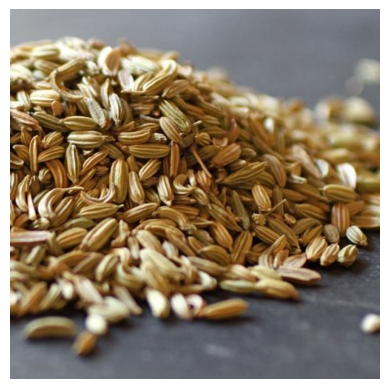

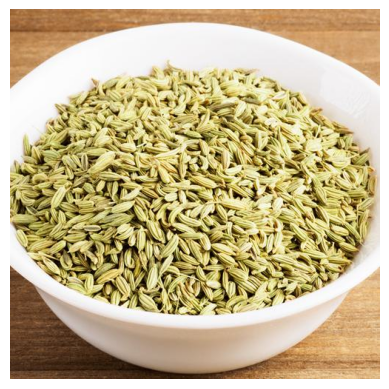

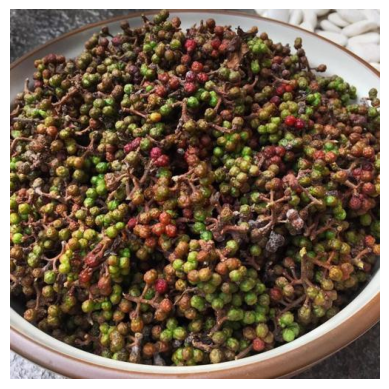

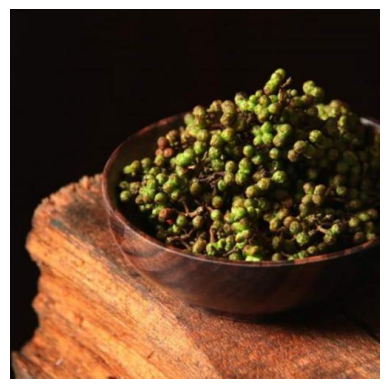

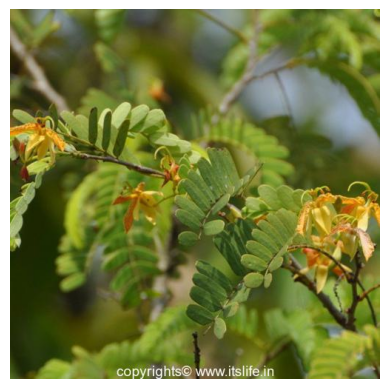

...

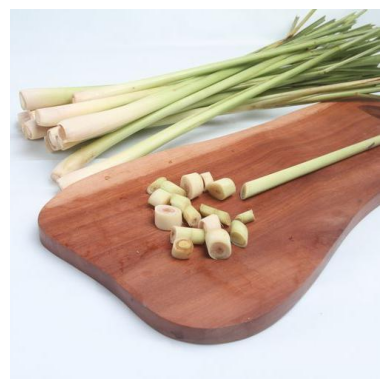

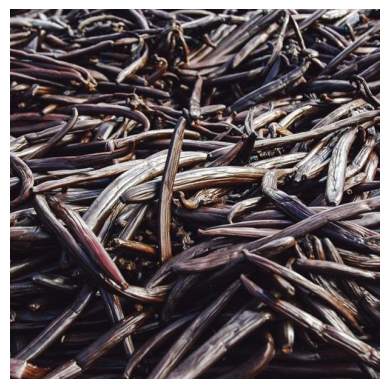

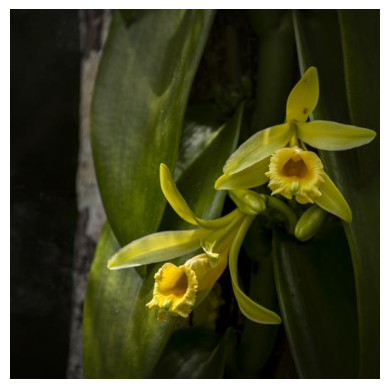

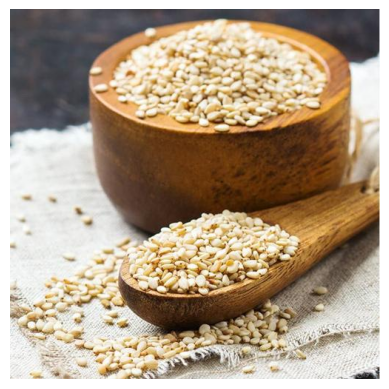

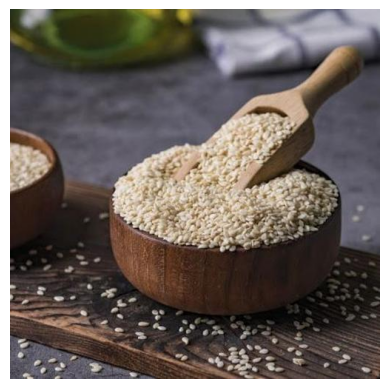

In [33]:
adas_files = os.listdir(adas_dir)
andaliman_files = os.listdir(andaliman_dir)
asamjawa_files = os.listdir(asamjawa_dir)

bombai_files = os.listdir(bombai_dir)
bmerah_files = os.listdir(bmerah_dir)
bputih_files = os.listdir(bputih_dir)

bketumbar_files = os.listdir(bketumbar_dir)
brempah_files = os.listdir(brempah_dir)
blawang_files = os.listdir(blawang_dir)

cengkeh_files = os.listdir(cengkeh_dir)
djeruk_files = os.listdir(djeruk_dir)
kemangi_files = os.listdir(kemangi_dir)

dketumbar_files = os.listdir(dketumbar_dir)
dsalam_files = os.listdir(dsalam_dir)
jahe_files = os.listdir(jahe_dir)

jinten_files = os.listdir(jinten_dir)
kapulaga_files = os.listdir(kapulaga_dir)
kmanis_files = os.listdir(kmanis_dir)

secang_files = os.listdir(secang_dir)
kemiri_files = os.listdir(kemiri_dir)
kemukus_files = os.listdir(kemukus_dir)

kencur_files = os.listdir(kencur_dir)
kluwek_files = os.listdir(kluwek_dir)
kunyit_files = os.listdir(kunyit_dir)

lada_files = os.listdir(lada_dir)
lengkuas_files = os.listdir(lengkuas_dir)
pala_files = os.listdir(pala_dir)

saffron_files = os.listdir(saffron_dir)
serai_files = os.listdir(serai_dir)
vanili_files = os.listdir(vanili_dir)
wijen_files = os.listdir(wijen_dir)


pic_index = 2

next_adas = [os.path.join(adas_dir, fname)
                for fname in adas_files[pic_index-2:pic_index]]
next_andaliman = [os.path.join(andaliman_dir, fname)
                for fname in andaliman_files[pic_index-2:pic_index]]
next_asamjawa = [os.path.join(asamjawa_dir, fname)
                for fname in asamjawa_files[pic_index-2:pic_index]]

next_bombai = [os.path.join(bombai_dir, fname)
               for fname in bombai_files[pic_index-2:pic_index]]
next_bmerah = [os.path.join(bmerah_dir, fname)
               for fname in bmerah_files[pic_index-2:pic_index]]
next_bputih = [os.path.join(bputih_dir, fname)
               for fname in bputih_files[pic_index-2:pic_index]]

next_bketumbar = [os.path.join(bketumbar_dir, fname)
                  for fname in bketumbar_files[pic_index-2:pic_index]]
next_brempah = [os.path.join(brempah_dir, fname)
                for fname in brempah_files[pic_index-2:pic_index]]
next_blawang = [os.path.join(blawang_dir, fname)
                for fname in blawang_files[pic_index-2:pic_index]]

next_cengkeh = [os.path.join(cengkeh_dir, fname)
                for fname in cengkeh_files[pic_index-2:pic_index]]
next_djeruk = [os.path.join(djeruk_dir, fname)
               for fname in djeruk_files[pic_index-2:pic_index]]
next_kemangi = [os.path.join(kemangi_dir, fname)
                for fname in kemangi_files[pic_index-2:pic_index]]

next_dketumbar = [os.path.join(dketumbar_dir, fname)
                  for fname in dketumbar_files[pic_index-2:pic_index]]
next_dsalam = [os.path.join(dsalam_dir, fname)
               for fname in dsalam_files[pic_index-2:pic_index]]
next_jahe = [os.path.join(jahe_dir, fname)
             for fname in jahe_files[pic_index-2:pic_index]]

next_jinten = [os.path.join(jinten_dir, fname)
               for fname in jinten_files[pic_index-2:pic_index]]
next_kapulaga = [os.path.join(kapulaga_dir, fname)
                 for fname in kapulaga_files[pic_index-2:pic_index]]
next_kmanis = [os.path.join(kmanis_dir, fname)
               for fname in kmanis_files[pic_index-2:pic_index]]

next_secang = [os.path.join(secang_dir, fname)
               for fname in secang_files[pic_index-2:pic_index]]
next_kemiri = [os.path.join(kemiri_dir, fname)
               for fname in kemiri_files[pic_index-2:pic_index]]
next_kemukus = [os.path.join(kemukus_dir, fname)
                for fname in kemukus_files[pic_index-2:pic_index]]

next_kencur = [os.path.join(kencur_dir, fname)
               for fname in kencur_files[pic_index-2:pic_index]]
next_kluwek = [os.path.join(kluwek_dir, fname)
               for fname in kluwek_files[pic_index-2:pic_index]]
next_kunyit = [os.path.join(kunyit_dir, fname)
               for fname in kunyit_files[pic_index-2:pic_index]]

next_lada = [os.path.join(lada_dir, fname)
             for fname in lada_files[pic_index-2:pic_index]]
next_lengkuas = [os.path.join(lengkuas_dir, fname)
                 for fname in lengkuas_files[pic_index-2:pic_index]]
next_pala = [os.path.join(pala_dir, fname)
             for fname in pala_files[pic_index-2:pic_index]]

next_saffron = [os.path.join(saffron_dir, fname)
                for fname in saffron_files[pic_index-2:pic_index]]
next_serai = [os.path.join(serai_dir, fname)
              for fname in serai_files[pic_index-2:pic_index]]
next_vanili = [os.path.join(vanili_dir, fname)
               for fname in vanili_files[pic_index-2:pic_index]]
next_wijen = [os.path.join(wijen_dir, fname)
              for fname in wijen_files[pic_index-2:pic_index]]

# Combine all image paths into a single list
image_paths = next_adas + next_andaliman + next_asamjawa + \
              next_bombai + next_bmerah + next_bputih + \
              next_bketumbar + next_brempah + next_blawang + \
              next_cengkeh + next_djeruk + next_kemangi + \
              next_dketumbar + next_dsalam + next_jahe + \
              next_jinten + next_kapulaga + next_kmanis + \
              next_secang + next_kemiri + next_kemukus + \
              next_kencur + next_kluwek + next_kunyit + \
              next_lada + next_lengkuas + next_pala + \
              next_saffron + next_serai + next_vanili + next_wijen

# Iterate through each image path and display the image
for i, img_path in enumerate(image_paths):
    img = mpimg.imread(img_path)
    plt.imshow(img)
    plt.axis('Off')
    plt.show()

### **Modelling**

In [34]:
resnet_101_model = ResNet101(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
resnet_101_model.trainable = False

171446536/171446536 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


In [37]:
resnet_model = ResNet101(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

resnet_model.trainable = False

# Check the number of layers in the base model
print("Number of layers in the base model: ", len(resnet_model.layers))

# Fine-tune from this layer onwards
fine_tune_at = 100  # Example: Fine-tune from layer 300 onwards

# Freeze all the layers before the `fine_tune_at` layer
for layer in resnet_model.layers[:fine_tune_at]:
    layer.trainable = False

Number of layers in the base model:  345


In [54]:
training_dir = "/content/final-datasets/train"
training_datagen = ImageDataGenerator(
      rescale = 1./255,
	    rotation_range=40,
      width_shift_range=0.2,
      height_shift_range=0.2,
      shear_range=0.2,
      zoom_range=0.2,
      horizontal_flip=True,
      fill_mode='nearest')

validation_dir = "/content/final-datasets/valid"
validation_datagen = ImageDataGenerator(rescale=1./255,
                                        validation_split = 0.4)

train_generator = training_datagen.flow_from_directory(
	training_dir,
	target_size=(224,224),
	class_mode='categorical',
  batch_size=32
)

validation_generator = validation_datagen.flow_from_directory(
	validation_dir,
	target_size=(224,224),
	class_mode='categorical',
  batch_size=32
)

model = tf.keras.models.Sequential([
    resnet_101_model,
    GlobalAveragePooling2D(),  # Pooling layer to reduce spatial dimensions
    tf.keras.layers.Dense(512, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(31, activation='softmax')
])

Found 5645 images belonging to 31 classes.
Found 1412 images belonging to 31 classes.


In [55]:
model.compile(loss='categorical_crossentropy', optimizer='rmsprop', metrics=['accuracy'])

history = model.fit(
    train_generator,  # Provide the training data generator
    epochs=30,
    batch_size = 32,
    verbose=2,
    validation_data=validation_generator,  # Provide the validation data generator (if available)
    callbacks=[early_stopping, reduce_lr],
)

Epoch 1/30


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


177/177 - 158s - 890ms/step - accuracy: 0.0602 - loss: 3.4048 - val_accuracy: 0.0687 - val_loss: 3.3091 - learning_rate: 0.0010
Epoch 2/30
177/177 - 107s - 606ms/step - accuracy: 0.0802 - loss: 3.2667 - val_accuracy: 0.0786 - val_loss: 3.2404 - learning_rate: 0.0010
Epoch 3/30
177/177 - 141s - 794ms/step - accuracy: 0.0898 - loss: 3.1832 - val_accuracy: 0.1190 - val_loss: 3.0598 - learning_rate: 0.0010
Epoch 4/30
177/177 - 145s - 817ms/step - accuracy: 0.1045 - loss: 3.1141 - val_accuracy: 0.1232 - val_loss: 3.0548 - learning_rate: 0.0010
Epoch 5/30
177/177 - 139s - 788ms/step - accuracy: 0.1196 - loss: 3.0669 - val_accuracy: 0.1317 - val_loss: 2.9891 - learning_rate: 0.0010
Epoch 6/30
177/177 - 106s - 597ms/step - accuracy: 0.1249 - loss: 3.0403 - val_accuracy: 0.1296 - val_loss: 2.9768 - learning_rate: 0.0010
Epoch 7/30
177/177 - 143s - 810ms/step - accuracy: 0.1274 - loss: 3.0075 - val_accuracy: 0.1629 - val_loss: 2.9203 - learning_rate: 0.0010
Epoch 8/30
177/177 - 141s - 798ms/step

In [50]:
# history = model.fit(
#     train_generator,
#     validation_data=validation_generator,
#     epochs=10,
#     batch_size = 32,
#     verbose=2,
#     callbacks=[early_stopping, reduce_lr],
# )

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


177/177 - 183s - 1s/step - accuracy: 0.7454 - loss: 0.9191 - val_accuracy: 0.0290 - val_loss: 6.4144 - learning_rate: 3.0000e-04
Epoch 2/10
177/177 - 112s - 633ms/step - accuracy: 0.8932 - loss: 0.3730 - val_accuracy: 0.0262 - val_loss: 5.3207 - learning_rate: 3.0000e-04
Epoch 3/10
177/177 - 109s - 614ms/step - accuracy: 0.9300 - loss: 0.2368 - val_accuracy: 0.0283 - val_loss: 4.6742 - learning_rate: 3.0000e-04
Epoch 4/10
177/177 - 142s - 805ms/step - accuracy: 0.9446 - loss: 0.1766 - val_accuracy: 0.0283 - val_loss: 6.9010 - learning_rate: 3.0000e-04
Epoch 5/10
177/177 - 109s - 614ms/step - accuracy: 0.9472 - loss: 0.1576 - val_accuracy: 0.0290 - val_loss: 7.6774 - learning_rate: 3.0000e-04
Epoch 6/10
177/177 - 109s - 613ms/step - accuracy: 0.9587 - loss: 0.1286 - val_accuracy: 0.0319 - val_loss: 4.7725 - learning_rate: 3.0000e-04
Epoch 7/10
177/177 - 110s - 623ms/step - accuracy: 0.9747 - loss: 0.0770 - val_accuracy: 0.0276 - val_loss: 4.8108 - learning_rate: 1.5000e-04
Epoch 8/10
17

### **Memvisualisasikan plot yang membandingkan akurasi pelatihan dan validasi dari model selama proses pelatihan**

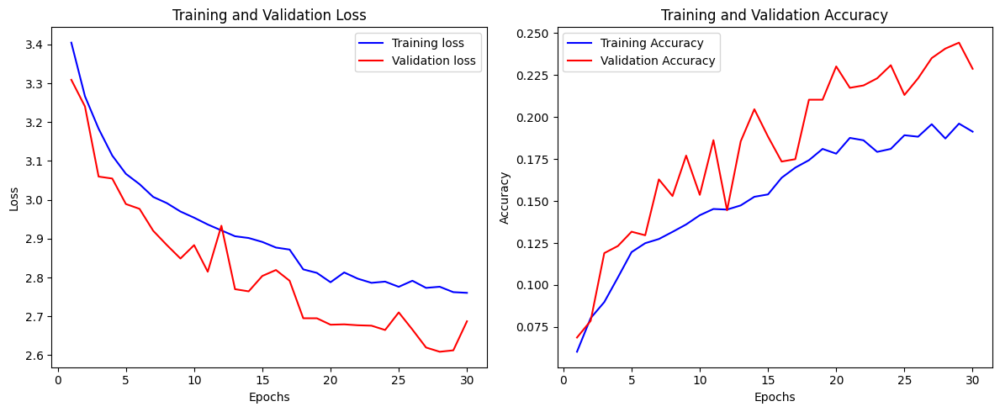

In [56]:
plot_history(history)

## **Save Model**

In [57]:
model.save("model.h5")

### **Mengunggah satu atau beberapa file gambar, memuatnya, memprediksi kelas gambar menggunakan model yang telah dilatih, dan mencetak hasil prediksi**

In [61]:
class_indices = np.load('/path/to/class_indices.npy', allow_pickle=True).item()

FileNotFoundError: [Errno 2] No such file or directory: '/path/to/class_indices.npy'

In [60]:
class_indices = np.load('class_indices.npy', allow_pickle=True).item()
class_labels = {v: k for k, v in class_indices.items()}
class_labels

FileNotFoundError: [Errno 2] No such file or directory: 'class_indices.npy'

In [ ]:
model = load_model('model.h5')

In [ ]:
from sklearn.metrics import classification_report

test_generator = val_datagen.flow_from_directory(
    val_dir,
    target_size=(224, 224),
    batch_size=32,
    shuffle=False,
    class_mode='categorical'
)


y_true = test_generator.classes

y_pred = model.predict(test_generator)
y_pred_classes = np.argmax(y_pred, axis=1)

# Hitung metrik
report = classification_report(y_true, y_pred_classes)
print(report)

In [ ]:
from google.colab import files
from tensorflow.keras.utils import load_img, img_to_array


# Load class indices
class_indices = np.load('class_indices.npy', allow_pickle=True).item()
class_labels = {v: k for k, v in class_indices.items()}

# Upload files
uploaded = files.upload()

# Create test folder if it doesn't exist
if not os.path.exists('test'):
    os.makedirs('test')

for fn in uploaded.keys():
    # Move the uploaded file to the test folder
    os.rename(fn, os.path.join('test', fn))
    path = os.path.join('test', fn)

    # Predicting images
    img = load_img(path, target_size=(224, 224))
    x = img_to_array(img)
    x = np.expand_dims(x, axis=0)

    predictions = model.predict(x)
    predicted_class_index = np.argmax(predictions, axis=1)[0]
    predicted_class_label = class_labels[predicted_class_index]

    # Menampilkan hasil prediksi
    print(f'Gambar {fn} diprediksi sebagai kelas: {predicted_class_label} dengan probabilitas: {predictions[0][predicted_class_index]}')

## **Convert the Model to all extensions that need it.**

### **Convert to .JSON**

In [ ]:
import h5py
import numpy as np
import json

def h5_to_dict(h5file):
    """
    Recursively convert h5py file to nested dictionary
    """
    result = {}
    for key, item in h5file.items():
        if isinstance(item, h5py.Dataset):
            result[key] = item[()]  # Convert h5py dataset to numpy array
        elif isinstance(item, h5py.Group):
            result[key] = h5_to_dict(item)  # Recursively convert groups
    return result

def save_as_json(data_dict, json_filename):
    with open(json_filename, 'w') as f:
        json.dump(data_dict, f, indent=4)

def h5_to_json(h5_filename, json_filename):
    with h5py.File(h5_filename, 'r') as f:
        data_dict = h5_to_dict(f)
        save_as_json(data_dict, json_filename)

if __name__ == '__main__':
    h5_filename = 'model.h5'
    json_filename = 'output.json'
    h5_to_json(h5_filename, json_filename)

### **Convert .h5 to .tflite**

In [ ]:
# Load necessary libraries
import tensorflow as tf
from tensorflow.keras.models import load_model

# Load the Keras model from .h5 file
model = load_model('model.h5')

# Ensure model is compiled
model.compile()

# Convert the model to TensorFlow Lite format
converter = tf.lite.TFLiteConverter.from_keras_model(model)

# Convert the model to TensorFlow Lite format without quantization
tflite_model = converter.convert()

# Save the TensorFlow Lite model to disk
with open('model.tflite', 'wb') as f:
    f.write(tflite_model)

print("Conversion to TensorFlow Lite complete.")
